Chargement de l'image : Image0


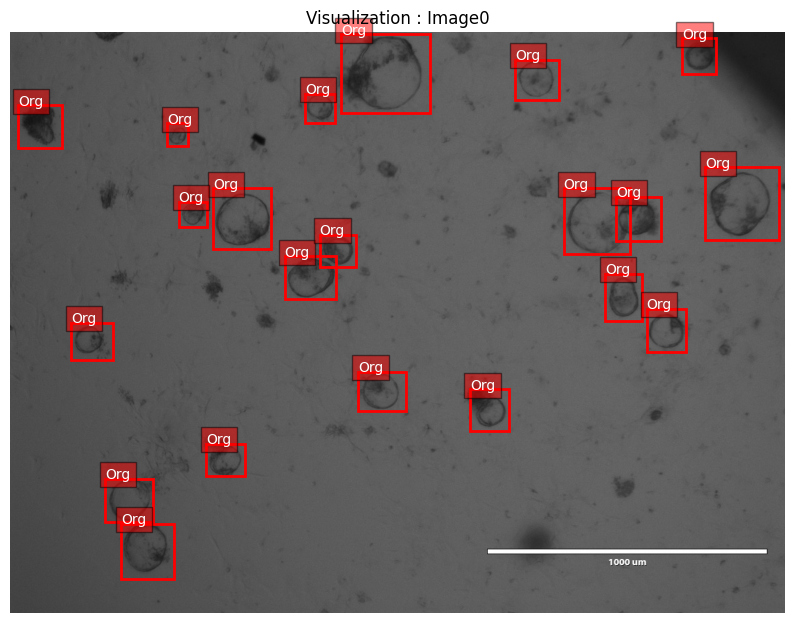

In [2]:
import h5py
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches

tellu_path = 'data/tellu.h5'

def load_and_show_example(img_index=0):
    with h5py.File(tellu_path, 'r') as hdf:
        group = hdf['train']
        img_names = list(group['images'].keys())
        
        target_name = img_names[img_index]
        print(f"Chargement de l'image : {target_name}")

        img = np.array(group['images'][target_name])
        labels = np.array(group['labels'][target_name])

    # Plots
    fig, ax = plt.subplots(1, 1, figsize=(10, 10))
    ax.imshow(img, cmap='gray')
    
    # Bounding Boxes
    for lbl in labels:
        # lbl = [class, x1, y1, x2, y2]
        x1, y1, x2, y2 = lbl[1], lbl[2], lbl[3], lbl[4]
        width = x2 - x1
        height = y2 - y1
        
        rect = patches.Rectangle((x1, y1), width, height, 
                                 linewidth=2, edgecolor='r', facecolor='none')
        ax.add_patch(rect)
        ax.text(x1, y1, f"Org", color='white', bbox=dict(facecolor='red', alpha=0.5))

    plt.title(f"Visualization : {target_name}")
    plt.axis('off')
    plt.show()

# Test
load_and_show_example(0)

Using cache found in C:\Users\DELL/.cache\torch\hub\facebookresearch_dinov2_main
C:\Users\DELL/.cache\torch\hub\facebookresearch_dinov2_main\dinov2\layers\swiglu_ffn.py:51: UserWarning: xFormers is not available (SwiGLU)
  warnings.warn("xFormers is not available (SwiGLU)")
C:\Users\DELL/.cache\torch\hub\facebookresearch_dinov2_main\dinov2\layers\attention.py:33: UserWarning: xFormers is not available (Attention)
  warnings.warn("xFormers is not available (Attention)")
C:\Users\DELL/.cache\torch\hub\facebookresearch_dinov2_main\dinov2\layers\block.py:40: UserWarning: xFormers is not available (Block)
  warnings.warn("xFormers is not available (Block)")


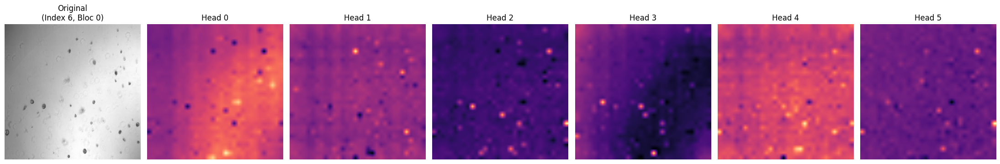

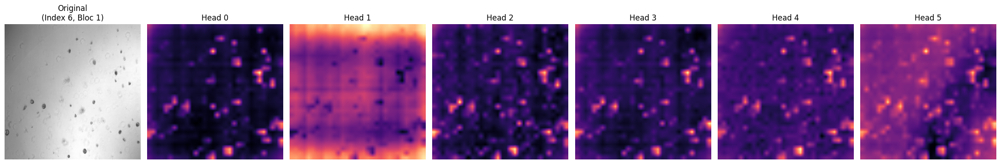

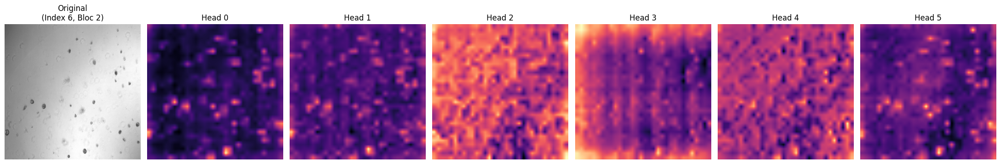

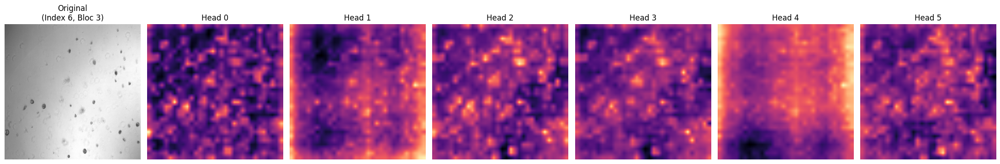

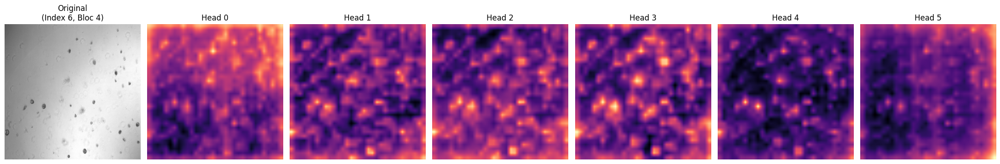

...

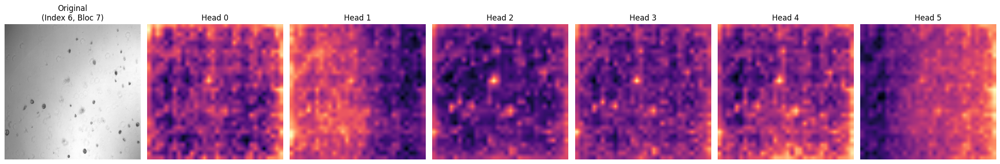

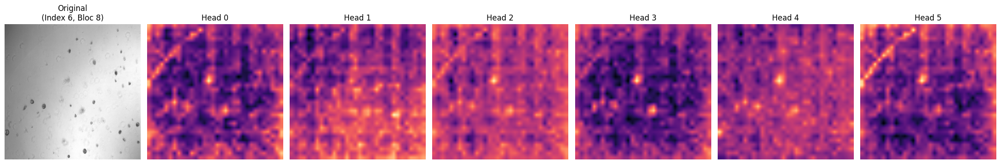

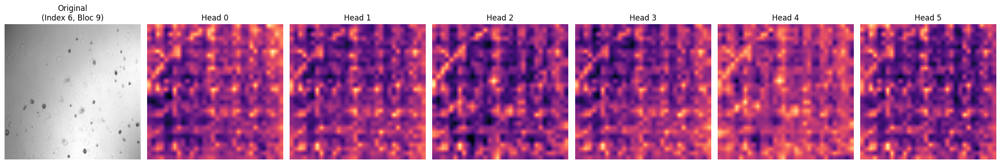

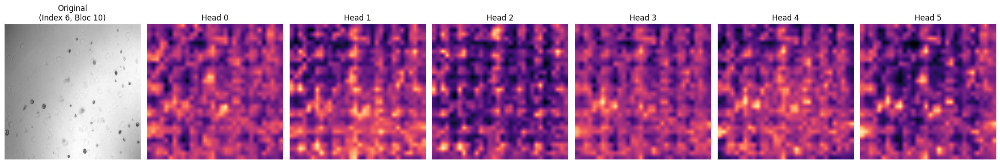

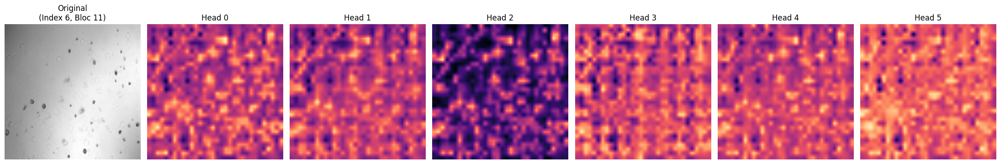

In [1]:
import h5py
import torch
import torch.nn as nn
import numpy as np
import matplotlib.pyplot as plt
from torchvision import transforms
from PIL import Image
import math
import os

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = torch.hub.load('facebookresearch/dinov2', 'dinov2_vits14').to(device)
model.eval()

# Img transformation to match model's expected input
img_size = 448 
transform = transforms.Compose([
    transforms.Resize((img_size, img_size)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

def interpolate_pos_encoding(model, x, w, h):
    """Gère l'adaptation des positions apprises à la nouvelle taille d'image."""
    npatch = x.shape[1] - 1
    N = model.pos_embed.shape[1] - 1
    if npatch == N and w == h:
        return model.pos_embed
    
    class_pos_embed = model.pos_embed[:, 0]
    patch_pos_embed = model.pos_embed[:, 1:]
    dim = x.shape[-1]
    
    w0 = h0 = int(math.sqrt(N))
    patch_pos_embed = torch.nn.functional.interpolate(
        patch_pos_embed.reshape(1, w0, h0, dim).permute(0, 3, 1, 2),
        size=(w // 14, h // 14),
        mode='bicubic',
        align_corners=False,
    )
    patch_pos_embed = patch_pos_embed.permute(0, 2, 3, 1).view(1, -1, dim)
    return torch.cat((class_pos_embed.unsqueeze(0), patch_pos_embed), dim=1)

def get_attention_maps(img_index=0, block_index=11, h5_path='data/tellu.h5'):
    """
    block_index : de 0 (entrée) à 11 (sortie) pour ViT-S
    """
    if not os.path.exists(h5_path):
        print(f"Erreur : {h5_path} introuvable.")
        return

    with h5py.File(h5_path, 'r') as hdf:
        group = hdf['train']['images']
        img_names = list(group.keys())
        img_raw = np.array(group[img_names[img_index]])
    
    img_pil = Image.fromarray(img_raw).convert('RGB')
    img_tensor = transform(img_pil).unsqueeze(0).to(device)

    with torch.no_grad():
        x = model.patch_embed(img_tensor)
        
        cls_token = model.cls_token.expand(x.shape[0], -1, -1)
        x = torch.cat((cls_token, x), dim=1)
        x = x + interpolate_pos_encoding(model, x, img_size, img_size)
        
        
        for i in range(block_index):
            x = model.blocks[i](x)
        
        target_block = model.blocks[block_index]
        B, N, C = x.shape
        num_heads = target_block.attn.num_heads
        
        qkv = target_block.attn.qkv(x).reshape(B, N, 3, num_heads, C // num_heads).permute(2, 0, 3, 1, 4)
        q, k, v = qkv[0], qkv[1], qkv[2]
        
        scale = target_block.attn.scale or (C // num_heads) ** -0.5
        attn = (q @ k.transpose(-2, -1)) * scale
        attn = attn.softmax(dim=-1)

    attentions = attn[0].cpu()
    nh = attentions.shape[0] 
    
    total_tokens = attentions.shape[-1]

    side = int(math.sqrt(total_tokens - 1))
    n_reg = total_tokens - 1 - (side * side) 
    
    start_idx = 1 + n_reg
    map_att = attentions[:, 0, start_idx:].reshape(nh, side, side)

    fig, axes = plt.subplots(1, nh + 1, figsize=(22, 5))
    axes[0].imshow(img_pil.resize((img_size, img_size)))
    axes[0].set_title(f"Original\n(Index {img_index}, Bloc {block_index})")
    axes[0].axis('off')
    
    for i in range(nh):
        axes[i+1].imshow(map_att[i], cmap='magma', interpolation='bilinear')
        axes[i+1].set_title(f"Head {i}")
        axes[i+1].axis('off')
    
    plt.tight_layout()
    plt.show()

# Tests 
for i in range(12):
    get_attention_maps(img_index=6, block_index=i)
